In [1]:
import numpy as np
# from numba import njit
import pandas as pd
# import polars as pl
from pathlib import Path
from collections import defaultdict
from tqdm import tqdm
import os
import gc

import warnings
warnings.filterwarnings('ignore')

In [2]:
def generate_fold_data(data_path, fold=1):
    
    df = pd.read_csv(data_path)
    df['datetime'] = pd.to_datetime(df['datetime'])
    df = df.iloc[50400*fold:(fold+1)*50400]
    df.sort_values('datetime', ascending=True, inplace=True)
    df.reset_index(inplace=True, drop=True)

    return df

data_path = Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GrammarEvolution/\PonyGE2/\all_data_1min_all.csv')
df = generate_fold_data(data_path, fold=1)

In [3]:
# df = pd.read_csv(Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GrammarEvolution/\PonyGE2/\all_data_1min.csv'))

# df = pd.read_csv('/kaggle/input/btcusd-test/BTCUSD_ohlcv.csv')
# df = pd.read_csv('/kaggle/input/btcusd-test/BTC-ETH-1m.csv')
# df = pd.read_csv('/kaggle/input/btcusd-test/all_data_1min.csv')
# df['datetime'] = pd.to_datetime(df['datetime'])
# # df = df.iloc[-10080:]
# # df = df.iloc[-525600:]
# # df = df.iloc[252000: (252000+50400)]
# df.sort_values('datetime', ascending=True, inplace=True)
# df.reset_index(inplace=True, drop=True)
price_data = {}
# price_data['open'] = df['open'].values
# price_data['close'] = df['close'].values
# price_data['high'] = df['high'].values
# price_data['low'] = df['low'].values
# price_data['volume'] = df['volume'].values
for col in df.columns:
    if col == 'datetime':
        continue
    else:
        price_data[col] = df[col].values
price_data['day_of_week'] = (df['datetime'].dt.dayofweek + 1).values
price_data['month'] = df['datetime'].dt.month.values
price_data['hour'] = df['datetime'].dt.hour.values
price_data['minute'] = df['datetime'].dt.minute.values

In [4]:
strategy_file_path = Path(r"C:/\Users/\vchar/\Downloads/\ge_results (5).csv")

try:
    df_str = pd.read_csv(strategy_file_path)
except:
    df_str = pd.read_csv(strategy_file_path, sep=';')
    
df_str = df_str[df_str['fitness'] < 0]
df_str = df_str[~df_str.duplicated()]

df_str_get1000 = df_str[df_str['fitness'] <= -1000]#.reset_index(drop=True).iloc[:1000]
df_str_lt1000 = df_str[df_str['fitness'] > -1000].reset_index(drop=True).iloc[:1000]
# df_str_small_fitness = df_str[(df_str['fitness'] > -100) & (df_str['fitness'] < -50)]

df_str = pd.concat([df_str_get1000, df_str_lt1000], axis=0)
# df_str = pd.concat([df_str, df_str_small_fitness], axis=0)

df_str.sort_values('fitness', ascending=True, inplace=True)
df_str.reset_index(drop=True, inplace=True)
df_str['strategy'] = [f'strategy{i+1}' for i in range(df_str.shape[0])]
df_str

,buy,exit_buy,sell,exit_sell,fitness,strategy
0,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,-2.147956e+06,strategy1
1,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,-2.057532e+06,strategy2
2,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,-2.057532e+06,strategy3
3,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,-2.057532e+06,strategy4
4,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,((numba_indicators.moving_average(prices=price...,(price_data['btc_close'][MAX_LAG:] == signals....,-2.046611e+06,strategy5
...,...,...,...,...,...,...
6452,"((get_lag(price_data['btc_high'], lag=3)[MAX_L...",(price_data['day_of_week'][MAX_LAG:] != 2),(price_data['btc_close'][MAX_LAG:] < get_lag(p...,(price_data['day_of_week'][MAX_LAG:] != 2),-2.407510e-02,strategy6453
6453,"((get_lag(price_data['btc_high'], lag=3)[MAX_L...",(price_data['day_of_week'][MAX_LAG:] != 7),"((get_lag(price_data['btc_low'], lag=3)[MAX_LA...",(price_data['day_of_week'][MAX_LAG:] != 7),-1.541803e-02,strategy6454
6454,"((get_lag(price_data['btc_high'], lag=3)[MAX_L...",(price_data['day_of_week'][MAX_LAG:] <= 6),"((get_lag(price_data['btc_low'], lag=3)[MAX_LA...",(price_data['day_of_week'][MAX_LAG:] <= 6),-1.541803e-02,strategy6455
6455,"((get_lag(price_data['btc_high'], lag=3)[MAX_L...",(price_data['day_of_week'][MAX_LAG:] >= 5),"((get_lag(price_data['btc_low'], lag=3)[MAX_LA...",(price_data['day_of_week'][MAX_LAG:] >= 5),-2.700245e-04,strategy6456


In [19]:
buy_signal = df_str.iloc[1000]['buy'].replace('[MAX_LAG:]', '')
buy_exit_signal = df_str.iloc[1000]['exit_buy'].replace('[MAX_LAG:]', '')
sell_signal = df_str.iloc[1000]['sell'].replace('[MAX_LAG:]', '')
sell_exit_signal = df_str.iloc[1000]['exit_sell'].replace('[MAX_LAG:]', '')

p = f'''import vectorbt as vbt
import pandas as pd
import numpy as np
from src.fitness.indicators import numba_indicators, signals
from src.fitness.performance.helper_func import merge_buy_sell_pnl, get_drawdowns, get_pnl, get_lag, get_var_lag
from src.fitness.performance.helper_func import trading_signals_buy, trading_signals_sell, change_exit
from numba import njit

COMMISSION = 0.015
SLIPPAGE = 0.00005
AVAILABLE_CAPITAL = 700000
TRADE_SIZE = 0.5
# MAX_LAG = 99

buy_idxs, buy_exit_idxs = trading_signals_buy(buy_signal={buy_signal}, exit_signal={buy_exit_signal})
sell_idxs, sell_exit_idxs = trading_signals_sell(sell_signal={sell_signal}, exit_signal={sell_exit_signal})
buy_idxs, buy_exit_idxs, sell_idxs, sell_exit_idxs = change_exit(buy_idxs, buy_exit_idxs, sell_idxs, sell_exit_idxs)'''

d = {'price_data': price_data}
exec(p, d)

# buy_idxs, buy_exit_idxs 
# sell_idxs, sell_exit_idxs

# sme_entries = sme_indicator.run(temp_df['btc_close'], temp_df['btc_open'], n_lags=lags_values, stop_loss_pct=sl_values, take_profit_pct=tp_values)
# buy_entries = (sme_entries.value == 1).vbt.fshift(1)
# sell_entries = (sme_entries.value == -1).vbt.fshift(1)
# buy_exits = sme_entries.buy_exit
# sell_exits = sme_entries.sell_exit

# sme_pf = vbt.Portfolio.from_signals(
#     temp_df['btc_open'], 
#     entries=buy_entries, 
#     exits=buy_exits,
#     init_cash=700000,
#     fees=0.015,
#     slippage=0.00005,
#     size=0.5,
#     short_entries=sell_entries,
#     short_exits=sell_exits
# )

# sme_pf.total_return()
# total_return = stats['Total Return [%]']
# sharpe_ratio = stats['Sharpe Ratio']
# max_drawdown = stats['Max Drawdown [%]']
# n_trades = stats['Total Trades']


In [20]:
np.unique(d['sell_idxs'])

array([  760,   853,   859,  1834,  3302,  4508,  4623,  5462,  7918,
       10627, 11930, 12067, 13826, 15845, 18251, 20277, 21467, 22371,
       23485, 23517, 24587, 24838, 25142, 25797, 26944, 29447, 30903,
       32361, 33925, 34714, 35687, 35842, 36557, 38685, 39703, 40753,
       41294, 42929, 42991, 43812, 43878, 44764, 46004, 46139, 47963,
       48746], dtype=int64)

In [7]:
# Start                            2024-04-24 18:14:00
# End                              2024-05-29 18:13:00
# Period                              35 days 00:00:00
# Start Value                                  70000.0
# End Value                               10418.000174
# Total Return [%]                          -85.117143
# Benchmark Return [%]                        4.171392
# Max Gross Exposure [%]                   8003.153022
# Total Fees Paid                         61428.959212
# Max Drawdown [%]                           85.782271
# Max Drawdown Duration               34 days 04:53:00
# Total Trades                                      69
# Total Closed Trades                               68
# Total Open Trades                                  1
# Open Trade PnL                           -116.391267
# Win Rate [%]                                5.882353
# Best Trade [%]                              4.593557
# Worst Trade [%]                            -4.882427
# Avg Winning Trade [%]                        3.37474
# Avg Losing Trade [%]                       -3.341664
# Avg Winning Trade Duration           1 days 09:38:30
# Avg Losing Trade Duration     0 days 10:38:15.937500
# Profit Factor                               0.063995
# Expectancy                               -874.494244
# Sharpe Ratio                              -20.004431
# Calmar Ratio                               -1.165742
# Omega Ratio                                 0.837244

In [8]:
df_str.iloc[1000]['buy'].replace('[MAX_LAG:]', '')

"((numba_indicators.moving_average(prices=price_data['btc_close'], window=8) > numba_indicators.moving_average(prices=price_data['btc_close'], window=451)) & (price_data['btc_close'] < (price_data['btc_low'] + 8012)) & (get_lag(numba_indicators.moving_average(prices=price_data['btc_close'], window=88), lag=1) < get_lag(numba_indicators.moving_average(prices=price_data['btc_close'], window=4398), lag=1)))"

In [21]:
buy_entries = np.array([1 if i in d['buy_idxs'] else 0 for i in range(len(price_data['btc_open']))])
sell_entries = np.array([1 if i in d['sell_idxs'] else 0 for i in range(len(price_data['btc_open']))])
buy_exits = np.array([1 if i in d['buy_exit_idxs'] else 0 for i in range(len(price_data['btc_open']))])
sell_exits = np.array([1 if i in d['sell_exit_idxs'] else 0 for i in range(len(price_data['btc_open']))])

In [22]:
np.sum(buy_entries) + np.sum(sell_entries)

74

In [23]:
# buy_entries = (np.arange(len(price_data['hour'])) == 1).vbt.fshift(1)
# sell_entries = (sme_entries.value == -1).vbt.fshift(1)
# buy_exits = sme_entries.buy_exit
# sell_exits = sme_entries.sell_exit

In [24]:
import vectorbt as vbt

pf = vbt.Portfolio.from_signals(
    price_data['btc_open'], 
    entries=buy_entries, 
    exits=buy_exits,
    init_cash=700000,
    fees=0.015,
    slippage=0.00005,
    size=0.5,
    short_entries=sell_entries,
    short_exits=sell_exits
)

In [25]:
pf.stats()

Start                              0.000000
End                            50399.000000
Period                         50400.000000
Start Value                   700000.000000
End Value                     658259.399930
Total Return [%]                  -5.962943
Benchmark Return [%]               5.169504
Max Gross Exposure [%]             3.578122
Total Fees Paid                47905.724306
Max Drawdown [%]                   6.040928
Max Drawdown Duration          49640.000000
Total Trades                      74.000000
Total Closed Trades               74.000000
Total Open Trades                  0.000000
Open Trade PnL                     0.000000
Win Rate [%]                       5.405405
Best Trade [%]                     3.455271
Worst Trade [%]                   -5.402051
Avg Winning Trade [%]              2.056488
Avg Losing Trade [%]              -2.880927
Avg Winning Trade Duration      1417.750000
Avg Losing Trade Duration        330.557143
Profit Factor                   

In [27]:
pf.stats()['Total Return [%]']
pf.stats()['Max Drawdown [%]']
pf.stats()['Total Trades']
pf.stats()['Max Drawdown Duration']

49640.0

In [15]:
pf.plot().show()

In [1]:
import os
from pathlib import Path

cur_dir = os.getcwd()
os.chdir(Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GrammarEvolution/\PonyGE2/\src'))

In [ ]:
! python ponyge.py --fitness_function max_fitness_numba_cache --grammar_file btc_test_vbt_tr.pybnf --population_size 500 --generations 100 --cache --mutate_duplicates --save_all --multicore --elite_size 50

In [1]:
import pandas as pd
import numpy as np
# from numba import njit
from pathlib import Path
import os

src_path = Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GitHubFiles/\V-genetic-algorithms---machine-learning/\PonyGE2/\src')
os.chdir(src_path)

In [2]:
def generate_data():

    # df = pd.read_csv(Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GitHubFiles/\V-genetic-algorithms---machine-learning/\PonyGE2/\datasets/\data_1min_folds/\data_fold1.csv'))
    df = pd.read_csv(Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GitHubFiles/\V-genetic-algorithms---machine-learning/\PonyGE2/\datasets/\data_folds_60min/\data_fold1.csv'))
    # df = pd.read_csv(Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GitHubFiles/\V-genetic-algorithms---machine-learning/\PonyGE2/\datasets/\data_240min.csv'))
    df['datetime'] = pd.to_datetime(df['datetime'])
    df.sort_values('datetime', ascending=True, inplace=True)
    df.reset_index(inplace=True, drop=True)

    price_data = {}
    
    for col in df.columns:
        if col == 'datetime':
            continue
        else:
            price_data[col] = df[col].values
    price_data['day_of_week'] = (df['datetime'].dt.dayofweek + 1).values
    price_data['month'] = df['datetime'].dt.month.values
    price_data['hour'] = df['datetime'].dt.hour.values
    price_data['minute'] = df['datetime'].dt.minute.values
    
    return price_data

In [3]:
price_data = generate_data()

In [4]:
d = {'price_data': price_data}

In [5]:
p = '''def fun(price_data):
  import vectorbt as vbt
  import pandas as pd
  import numpy as np
  from fitness.indicators import numba_indicators_nan, signals
  from fitness.performance.helper_func import merge_buy_sell_pnl, get_drawdowns, get_pnl, get_lag
  from fitness.performance.helper_func import trading_signals_buy, trading_signals_sell, change_exit
  from numba import njit
  import vectorbt as vbt
  COMMISSION = 0.015
  SLIPPAGE = 0.00005
  AVAILABLE_CAPITAL = 700000
  TRADE_SIZE = 0.5
  buy_idxs, buy_exit_idxs = trading_signals_buy(buy_signal=((price_data['hour'] >= 22) & (price_data['hour'] <= 23)), exit_signal=((price_data['hour'] >= 21) & (price_data['hour'] <= 23)))
  sell_idxs, sell_exit_idxs = trading_signals_sell(sell_signal=((price_data['hour'] >= 21) & (price_data['hour'] <= 23)), exit_signal=((price_data['hour'] >= 21) & (price_data['hour'] <= 23)))
  try:
    buy_idxs, buy_exit_idxs, sell_idxs, sell_exit_idxs = change_exit(buy_idxs, buy_exit_idxs, sell_idxs, sell_exit_idxs)
  except:
    pass
  if (len(buy_idxs) == 0 or len(buy_exit_idxs) == 0) and (len(sell_idxs) == 0 or len(sell_exit_idxs) == 0):
    return 999
  buy_entries = np.array([1 if i in buy_idxs else 0 for i in range(len(price_data['btc_open']))])
  sell_entries = np.array([1 if i in sell_idxs else 0 for i in range(len(price_data['btc_open']))])
  buy_exits = np.array([1 if i in buy_exit_idxs else 0 for i in range(len(price_data['btc_open']))])
  sell_exits = np.array([1 if i in sell_exit_idxs else 0 for i in range(len(price_data['btc_open']))])
  pf = vbt.Portfolio.from_signals(price_data['btc_open'], entries=buy_entries, exits=buy_exits, init_cash=AVAILABLE_CAPITAL, fees=COMMISSION, slippage=SLIPPAGE, size=TRADE_SIZE, short_entries=sell_entries, short_exits=sell_exits)
  fitness = pf.stats()['Total Return [%]']
  if np.isnan(fitness):
    return 999
  return -fitness
fitness = fun(price_data)'''

In [1]:
import pandas as pd
import os
from pathlib import Path
from collections import defaultdict
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

In [2]:
def get_data_dict(data_path, bar_size):

    price_data = {}

    df = pd.read_csv(data_path)
    df['datetime'] = pd.to_datetime(df['datetime'])
    df.sort_values('datetime', ascending=True, inplace=True)

    if bar_size == 1:
        price_data['btc_close'] = df['btc_close'].values
        price_data['btc_open'] = df['btc_open'].values
        price_data['datetime'] = df['datetime'].values
    else:
        df_cols = list(df.columns)
        df_cols = list(set([col.split('_')[0] for col in df_cols if col!='datetime']))

        df.set_index('datetime', inplace=True)

        instrument_name = df_cols[0]

        final_df = df.resample(f'{bar_size}min').agg({
                f'{instrument_name}_open': 'first',
                f'{instrument_name}_high': 'max',
                f'{instrument_name}_low': 'min',
                f'{instrument_name}_close': 'last',
                f'{instrument_name}_volume': 'sum'
            })
        final_df.reset_index(inplace=True)

        for instrument_name in df_cols[1:]:
            temp_df = df.resample(f'{bar_size}min').agg({
                f'{instrument_name}_open': 'first',
                f'{instrument_name}_high': 'max',
                f'{instrument_name}_low': 'min',
                f'{instrument_name}_close': 'last',
                f'{instrument_name}_volume': 'sum'
            })
            temp_df.reset_index(inplace=True)

            final_df = pd.merge(final_df, temp_df, on='datetime', how='left')

        final_df.reset_index(inplace=True, drop=True)

        price_data['btc_close'] = final_df['btc_close'].values
        price_data['btc_open'] = final_df['btc_open'].values
        price_data['datetime'] = final_df['datetime'].values

    return price_data

In [3]:
# cur_dir = os.getcwd()
os.chdir(Path(r'C:/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GrammarEvolution/\PonyGE2/\src'))

from fitness.performance.testing_func import calculate_mean_performance, get_perf_df

data_path = Path(r'/\Users/\vchar/\OneDrive/\Desktop/\ML Projects/\Upwork/\AlgoT_ML_Dev/\GrammarEvolution/\PonyGE2/\all_data_1min.csv')

In [4]:
def get_txt_code(
    buy_signal_txt, buy_exit_txt, sell_signal_txt, sell_exit_txt,
    fee=0.015, slippage=0.00005, inv_amount=700000, trade_size=0.5, max_lag=99
):

    text_code = f'''import os
CUR_DIR = os.getcwd()
# os.chdir('src')
import pandas as pd
import numpy as np
import vectorbt as vbt
import gc
from fitness.indicators import numba_indicators_nan, signals
from fitness.performance.helper_func import merge_buy_sell_pnl, get_drawdowns, get_pnl, get_lag
from fitness.performance.helper_func import trading_signals_buy, trading_signals_sell, change_exit
# os.chdir(CUR_DIR)
#from numba import njit
COMMISSION = {fee}
SLIPPAGE = {slippage}
AVAILABLE_CAPITAL = {inv_amount}
TRADE_SIZE = {trade_size}
MAX_LAG = {max_lag}
try:
    buy_idxs, buy_exit_idxs = trading_signals_buy(buy_signal={buy_signal_txt}, exit_signal={buy_exit_txt})
except:
    buy_idxs, buy_exit_idxs = [], []
try:
    sell_idxs, sell_exit_idxs = trading_signals_sell(sell_signal={sell_signal_txt}, exit_signal={sell_exit_txt})
except:
    sell_idxs, sell_exit_idxs = [], []
# if (len(buy_idxs) == 0 or len(buy_exit_idxs) == 0) and (len(sell_idxs) == 0 or len(sell_exit_idxs) == 0):
#     fitness = -9999999
#     avg_drawdown = -9999999
# else:
try:
    buy_idxs, buy_exit_idxs, sell_idxs, sell_exit_idxs = change_exit(buy_idxs, buy_exit_idxs, sell_idxs, sell_exit_idxs)
except:
    pass
if (len(buy_idxs) == 0 or len(buy_exit_idxs) == 0) and (len(sell_idxs) == 0 or len(sell_exit_idxs) == 0):
    total_return_p = np.nan
    sharpe_ratio = np.nan
    sortino_ratio = np.nan
    omega_ratio = np.nan
    md_duration_m = np.nan
    max_drawdown_p = np.nan
    calmar_ratio = np.nan
    return_md_r = np.nan
else:
    buy_entries = np.array([1 if i in buy_idxs else 0 for i in range(len(price_data['btc_open']))])
    buy_exits = np.array([1 if i in buy_exit_idxs else 0 for i in range(len(price_data['btc_open']))])
    sell_entries = np.array([1 if i in sell_idxs else 0 for i in range(len(price_data['btc_open']))])
    sell_exits = np.array([1 if i in sell_exit_idxs else 0 for i in range(len(price_data['btc_open']))])
    price_data_open = pd.Series(price_data['btc_open'], index=pd.to_datetime(price_data['datetime']))
    pf = vbt.Portfolio.from_signals(
        price_data_open, entries=buy_entries, exits=buy_exits, 
        init_cash=AVAILABLE_CAPITAL, fees=COMMISSION, 
        slippage=SLIPPAGE, size=TRADE_SIZE, 
        short_entries=sell_entries, short_exits=sell_exits
    )
    total_return_p = pf.stats()['Total Return [%]']
    sharpe_ratio = pf.stats()['Sharpe Ratio']
    sortino_ratio = pf.stats()['Sortino Ratio']
    omega_ratio = pf.stats()['Omega Ratio']
    md_duration_m = pf.stats()['Max Drawdown Duration'].total_seconds() / 60
    max_drawdown_p = pf.stats()['Max Drawdown [%]']
    calmar_ratio = pf.stats()['Calmar Ratio']
    n_trades = pf.stats()['Total Closed Trades']
    return_md_r = total_return_p / max_drawdown_p
gc.collect()'''
    
    return text_code

In [5]:
windows = [10, 25, 40]

bar_sizes = [
    1, 2, 5, 10, 20, 30, 45, 60, 75, 90, 120, 150, 180, 
    210, 240, 300, 360, 420, 480, 600, 720, 840, 960, 1150, 1440
]

performance_dict = defaultdict(list)

for bar_size in tqdm(bar_sizes):

    for window in windows:

        price_data = get_data_dict(data_path, bar_size=bar_size)

        buy_signal_txt = f"price_data['btc_close'] == signals.moving_max(price_data['btc_close'], window={window})"
        buy_exit_txt = f"price_data['btc_close'] == signals.moving_min(price_data['btc_close'], window={window})"
        sell_signal_txt = f"price_data['btc_close'] == signals.moving_min(price_data['btc_close'], window={window})"
        sell_exit_txt = f"price_data['btc_close'] == signals.moving_max(price_data['btc_close'], window={window})"

        text_code = get_txt_code(buy_signal_txt, buy_exit_txt, sell_signal_txt, sell_exit_txt)

        exec_dict = {'price_data': price_data}
        exec(text_code, exec_dict)

        try:
            performance_dict['n_trades'].append(exec_dict['n_trades'])
            performance_dict['total_return_p'].append(exec_dict['total_return_p'])
            performance_dict['return_md_r'].append(exec_dict['return_md_r'])
            performance_dict['calmar_ratio'].append(exec_dict['calmar_ratio'])
            performance_dict['drawdown'].append(exec_dict['max_drawdown_p'])
            performance_dict['drawdown_dur_m'].append(exec_dict['md_duration_m'])
            performance_dict['omega_ratio'].append(exec_dict['omega_ratio'])
            performance_dict['sharpe_ratio'].append(exec_dict['sharpe_ratio'])
            performance_dict['sortino_ratio'].append(exec_dict['sortino_ratio'])
            performance_dict['window'].append(window)
            performance_dict['bar_size'].append(bar_size)
        except:
            pass

100%|██████████| 25/25 [01:11<00:00,  2.88s/it]


In [6]:
def plot_stat(stat_name, stats_dict, windows,figsize=(10, 10)):

    fig = plt.figure(figsize=figsize)

    subplot_idx = 1

    for window in windows:

        plt.subplot(3, 1, subplot_idx)

        pnl_list = [stats_dict[stat_name][i] for i in range(len(stats_dict['window'])) if stats_dict['window'][i]==window]

        bar_list = [stats_dict['bar_size'][i] for i in range(len(stats_dict['window'])) if stats_dict['window'][i]==window]

        plt.bar(np.arange(len(bar_list)), pnl_list)
        plt.xticks(np.arange(len(bar_list)), bar_list, rotation=45)
        plt.title(f"rolling window = {window}")
        plt.xlabel('bar_size')
        plt.ylabel(stat_name)

        subplot_idx += 1

    plt.tight_layout()

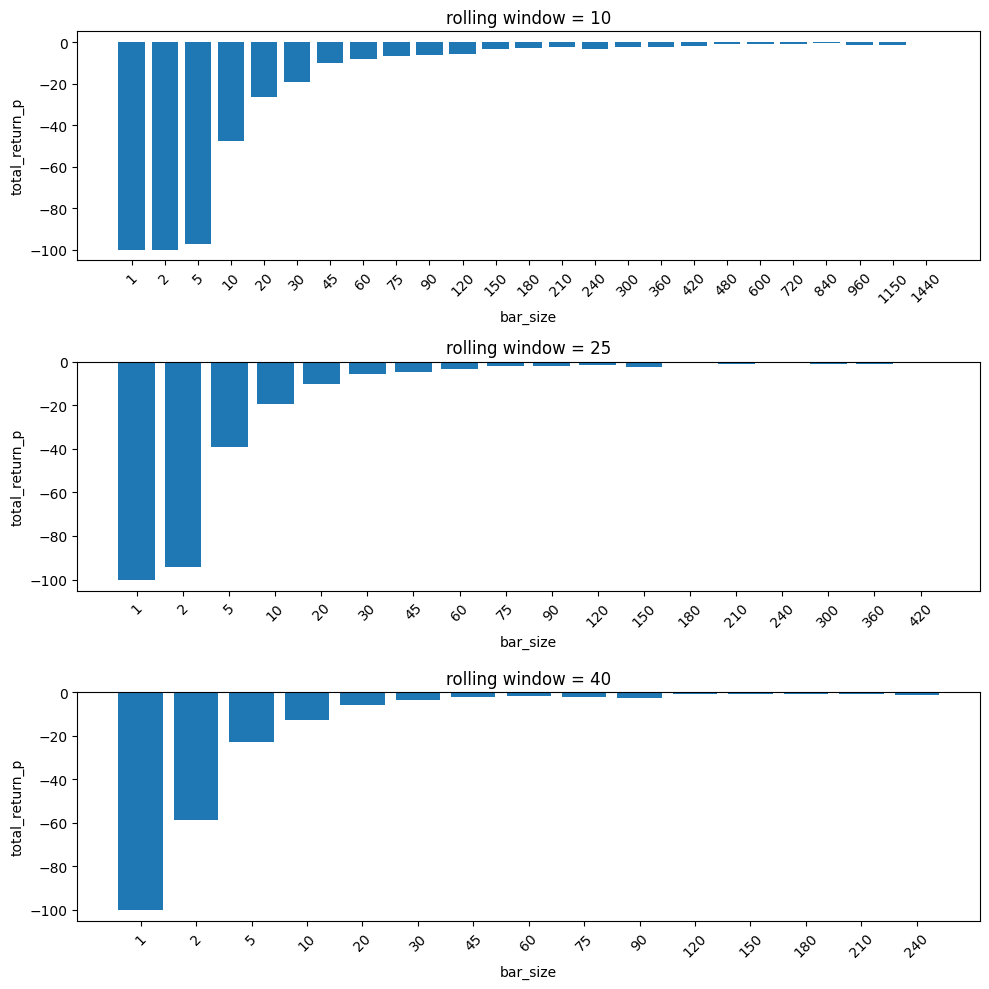

In [7]:
plot_stat(stat_name='total_return_p', stats_dict=performance_dict, windows=windows)

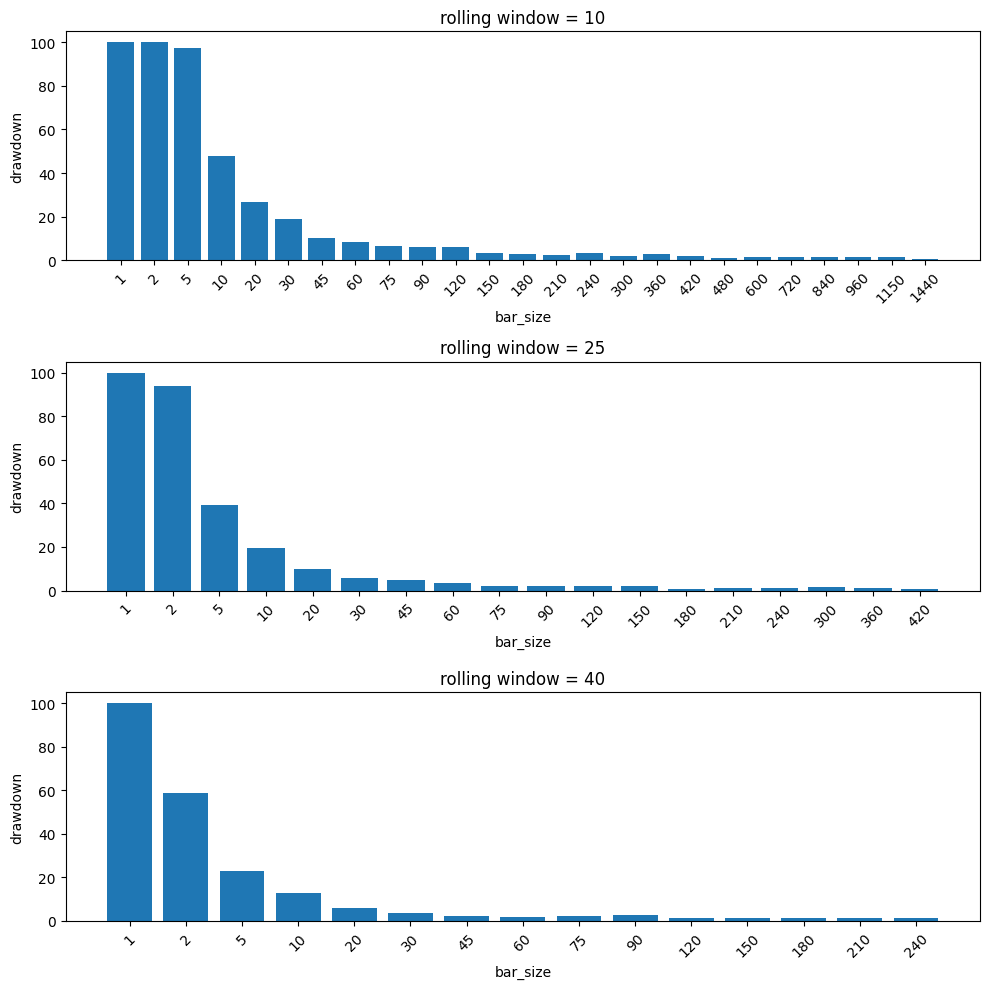

In [8]:
plot_stat(stat_name='drawdown', stats_dict=performance_dict, windows=windows)

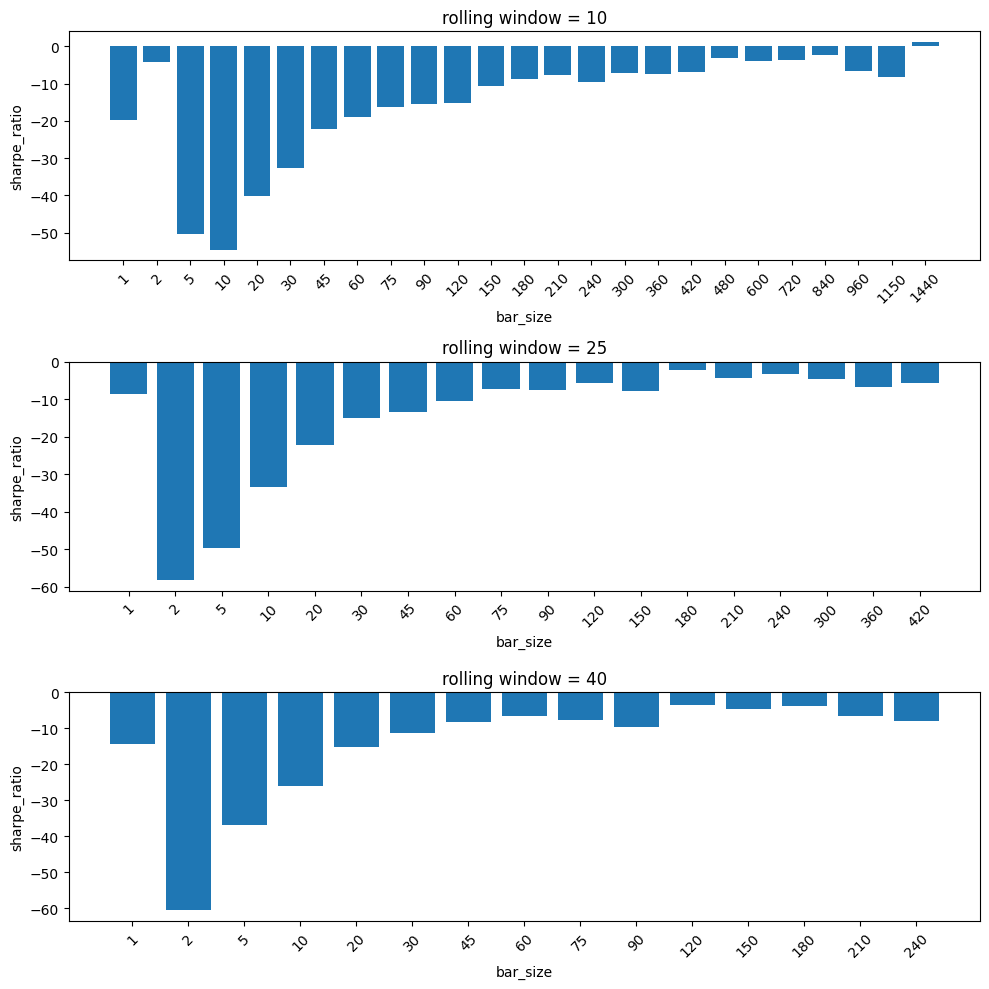

In [9]:
plot_stat(stat_name='sharpe_ratio', stats_dict=performance_dict, windows=windows)

In [10]:
windows = [10, 25, 40]

bar_sizes = [
    1, 2, 5, 10, 20, 30, 45, 60, 75, 90, 120, 150, 180, 
    210, 240, 300, 360, 420, 480, 600, 720, 840, 960, 1150, 1440
]

performance_dict = defaultdict(list)

for bar_size in tqdm(bar_sizes):

    for window in windows:

        price_data = get_data_dict(data_path, bar_size=bar_size)

        buy_signal_txt = f"price_data['btc_close'] == signals.moving_min(price_data['btc_close'], window={window})"
        buy_exit_txt = f"price_data['btc_close'] == signals.moving_max(price_data['btc_close'], window={window})"
        sell_signal_txt = f"price_data['btc_close'] == signals.moving_max(price_data['btc_close'], window={window})"
        sell_exit_txt = f"price_data['btc_close'] == signals.moving_min(price_data['btc_close'], window={window})"

        text_code = get_txt_code(buy_signal_txt, buy_exit_txt, sell_signal_txt, sell_exit_txt)

        exec_dict = {'price_data': price_data}
        exec(text_code, exec_dict)

        try:
            performance_dict['n_trades'].append(exec_dict['n_trades'])
            performance_dict['total_return_p'].append(exec_dict['total_return_p'])
            performance_dict['return_md_r'].append(exec_dict['return_md_r'])
            performance_dict['calmar_ratio'].append(exec_dict['calmar_ratio'])
            performance_dict['drawdown'].append(exec_dict['max_drawdown_p'])
            performance_dict['drawdown_dur_m'].append(exec_dict['md_duration_m'])
            performance_dict['omega_ratio'].append(exec_dict['omega_ratio'])
            performance_dict['sharpe_ratio'].append(exec_dict['sharpe_ratio'])
            performance_dict['sortino_ratio'].append(exec_dict['sortino_ratio'])
            performance_dict['window'].append(window)
            performance_dict['bar_size'].append(bar_size)
        except:
            pass

100%|██████████| 25/25 [01:07<00:00,  2.70s/it]


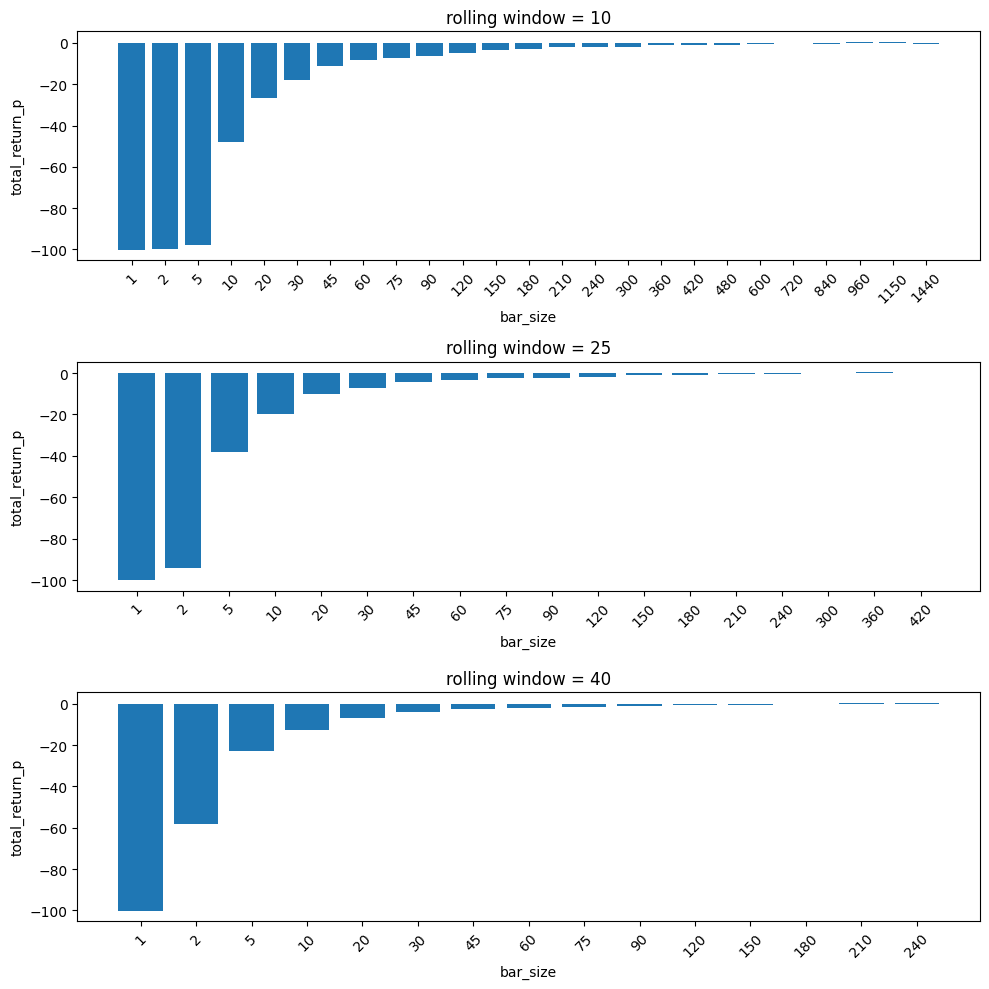

In [11]:
plot_stat(stat_name='total_return_p', stats_dict=performance_dict, windows=windows)

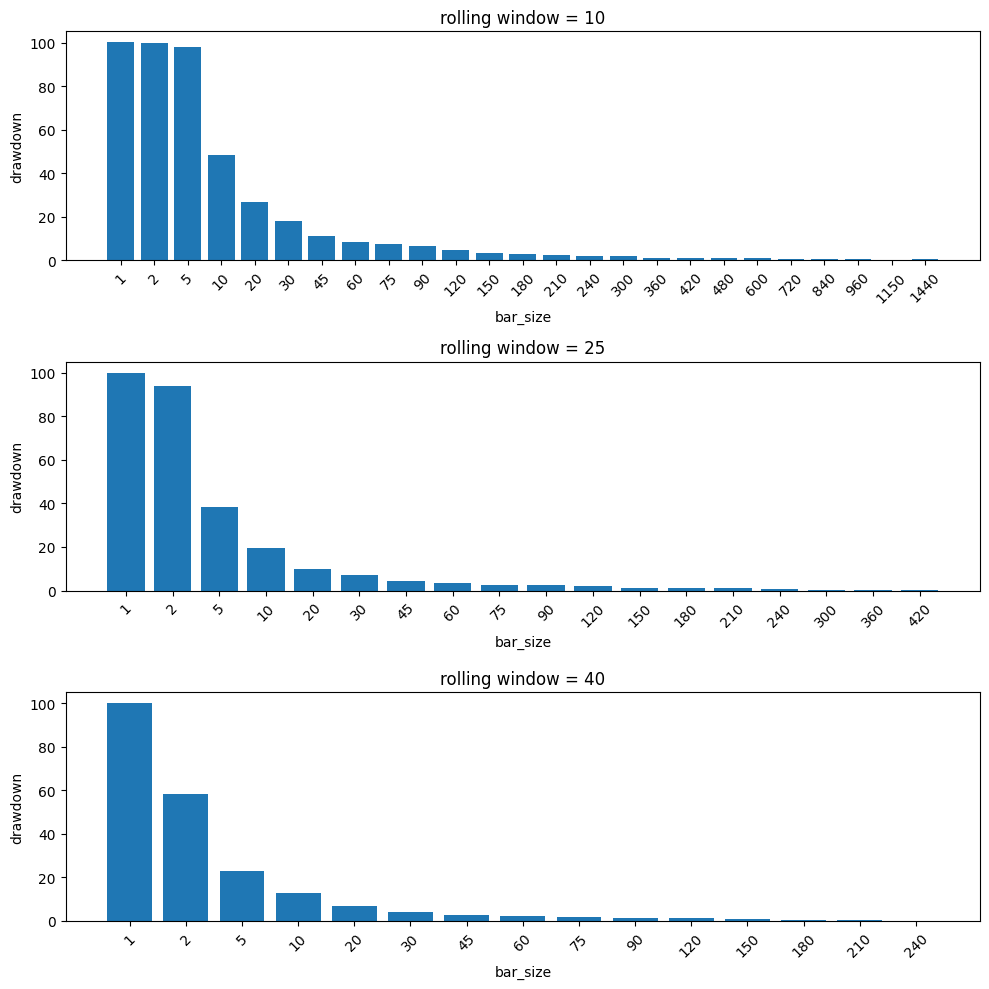

In [12]:
plot_stat(stat_name='drawdown', stats_dict=performance_dict, windows=windows)

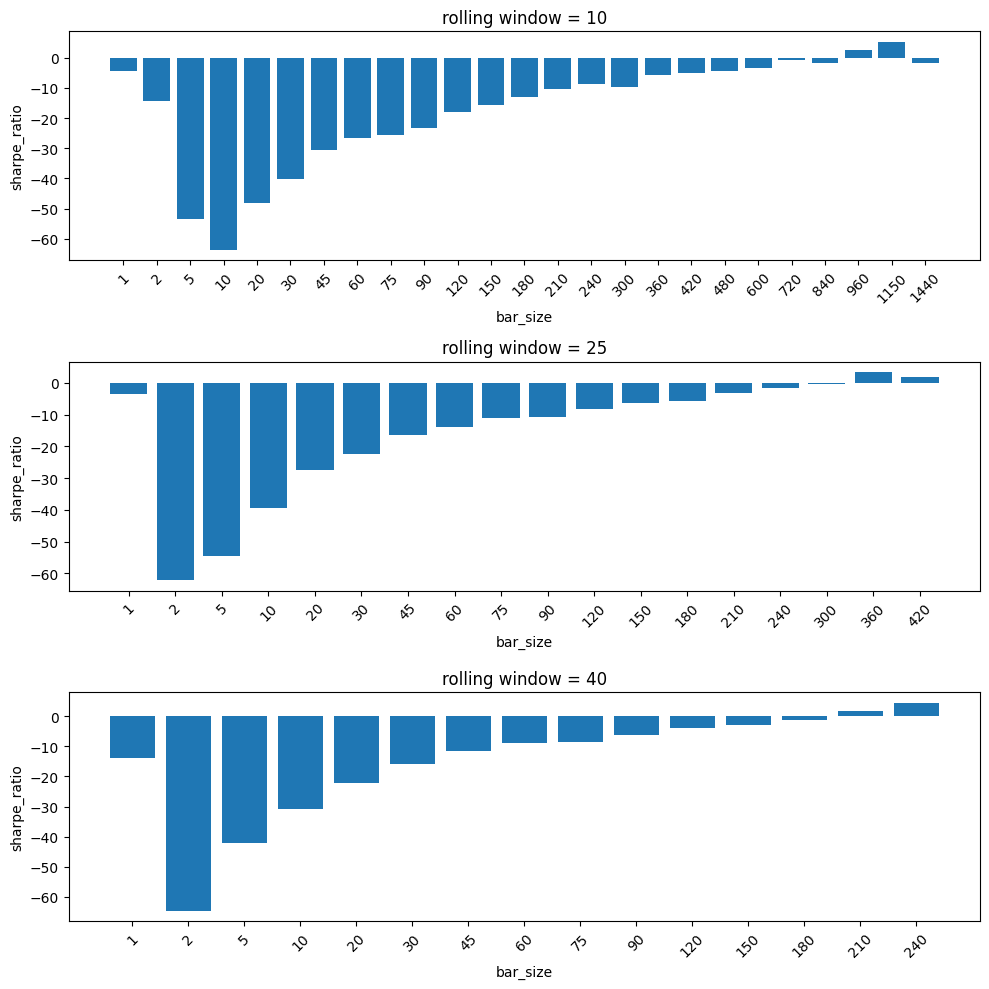

In [13]:
plot_stat(stat_name='sharpe_ratio', stats_dict=performance_dict, windows=windows)